In [27]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation 
plt.rcParams.update({'font.size': 16})
import glob
import matplotlib.cm as cm

In [24]:
import torch
import numpy as np
import networkx as nx
import os

from floorplans.lidar.lidar import Lidar2D, OnlineTrajectoryLidarDataset

In [19]:
# results_dir = "../results/2021-09-02_07-49_dist_online_dense_v0"
results_dir2 = "../results/2021-09-02_14-20_dist_online_dense_v1"
results_dir0 = "../results/2021-09-04_14-54_dist_online_dense_v1"
results_dir2 = "../results/2021-09-04_20-28_dist_online_dense_v1"


#results1 = torch.load(os.path.join(results_dir1, "cadmm_results.pt"), map_location=torch.device("cpu"))
#results1 = torch.load(os.path.join(results_dir, "cadmm_lin_results.pt"), map_location=torch.device("cpu"))
#results2 = torch.load(os.path.join(results_dir1, "cadmm_log_results.pt"), map_location=torch.device("cpu"))
#results3 = torch.load(os.path.join(results_dir, "cadmm_const_results.pt"), map_location=torch.device("cpu"))
results1 = torch.load(os.path.join(results_dir2, "cadmm_log_results.pt"), map_location=torch.device("cpu"))
results2 = torch.load(os.path.join(results_dir2, "dsgt_results.pt"), map_location=torch.device("cpu"))
results3 = torch.load(os.path.join(results_dir2, "dsgd_results.pt"), map_location=torch.device("cpu"))
results_solo = torch.load(os.path.join(results_dir0, "solo_results.pt"), map_location=torch.device("cpu"))


# Validation loss

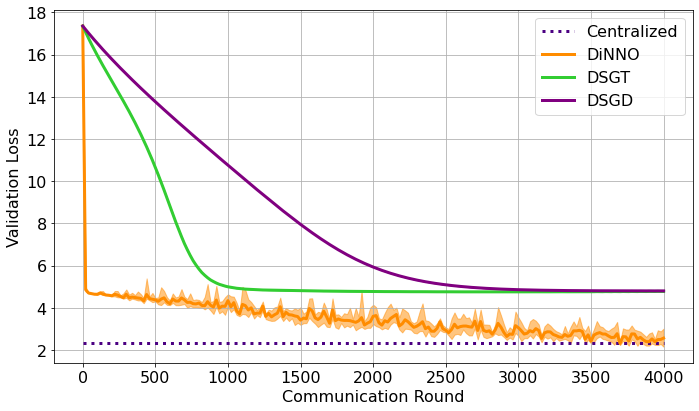

In [20]:
vl1 = torch.stack(results1["validation_loss"])
vl2 = torch.stack(results2["validation_loss"])
vl3 = torch.stack(results3["validation_loss"])

(fig, ax) = plt.subplots(figsize=(10, 6), tight_layout=True)

t = np.arange(vl2.shape[0]) * 20

#ind_color = "cornflowerblue"
#for i in results_solo.keys():
#    if i != 0:
#        ax.plot(t, results_solo[i]["validation_loss"] * np.ones_like(t),
#            color=ind_color, linestyle=":", linewidth=3)
#ax.plot(t, results_solo[0]["validation_loss"] * np.ones_like(t), 
#    color=ind_color, linestyle=":", label="Individual", linewidth=3)

centralized_vloss = 2.34
ax.plot(t, centralized_vloss * np.ones_like(t), color="indigo",
    linestyle=":", linewidth=3, label="Centralized")

dsgt_mean = torch.mean(vl2, dim=1)
dsgt_min = torch.amin(vl2, dim=1)
dsgt_max = torch.amax(vl2, dim=1)
cadmm_mean = torch.mean(vl1, dim=1)
cadmm_min = torch.amin(vl1, dim=1)
cadmm_max = torch.amax(vl1, dim=1)
dsgd_mean = torch.mean(vl3, dim=1)
dsgd_min = torch.amin(vl3, dim=1)
dsgd_max = torch.amax(vl3, dim=1)
cadmm_color = "darkorange"
dsgt_color = "limegreen"
dsgd_color = "purple"

ax.plot(t, cadmm_mean, color=cadmm_color, linewidth=3, label="DiNNO")
ax.plot(t, dsgt_mean, color=dsgt_color, linewidth=3, label="DSGT")
ax.plot(t, dsgd_mean, color=dsgd_color, linewidth=3, label="DSGD")
ax.fill_between(t, cadmm_min, cadmm_max, color=cadmm_color, alpha=0.5)
ax.fill_between(t, dsgt_min, dsgt_max, color=dsgt_color, alpha=0.5)
ax.fill_between(t, dsgd_min, dsgd_max, color=dsgd_color, alpha=0.5)
#ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_xlabel("Communication Round")
ax.set_ylabel("Validation Loss")

fig.savefig("odense_vloss.svg")

# Density Plots

In [21]:
# Settings
data_dir = "../floorplans/32_data"
waypoint_subdir = "tight_paths"
img_path = os.path.join(data_dir, "floor_img.png")
num_beams = 20
beam_samps = 25
beam_length = 0.2
spline_res = 30
samp_distribution_factor = 1.0
collision_samps = 50
fine_samps = 3
num_scans_in_window = 30
spline_res = 30

# Setup Lidar Object
lidar = Lidar2D(img_path, num_beams, beam_length, beam_samps,
    samp_distribution_factor, collision_samps, fine_samps, border_width=30)

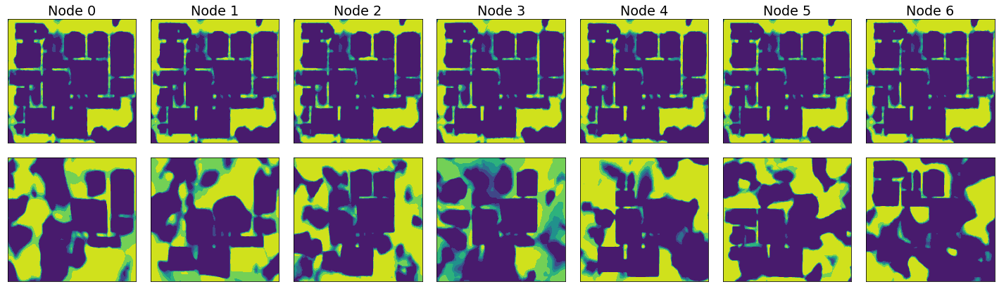

In [22]:
dens1 = results1["mesh_grid_density"]
dens2 = results2["mesh_grid_density"]
locs = results1["mesh_inputs"]

N = 7
(fig, axs) = plt.subplots(nrows=2, ncols=N, figsize=(20, 6), tight_layout=True)

for i in range(N):
    pred1 = (torch.squeeze(dens1[-1]))[i, :]
    axs[0, i].tricontourf(locs[:, 0], locs[:, 1], pred1)
    axs[0, i].set_title("Node {}".format(i))
    axs[0, i].set_xticklabels([])
    axs[0, i].set_xticks([])
    axs[0, i].set_yticklabels([])
    axs[0, i].set_yticks([])
    pred2 = (torch.squeeze(results_solo[i]["mesh_grid_density"]))
    axs[1, i].tricontourf(locs[:, 0], locs[:, 1], pred2)
    axs[1, i].set_xticklabels([])
    axs[1, i].set_xticks([])
    axs[1, i].set_yticklabels([])
    axs[1, i].set_yticks([])

fig.savefig("odense_mesh.svg")

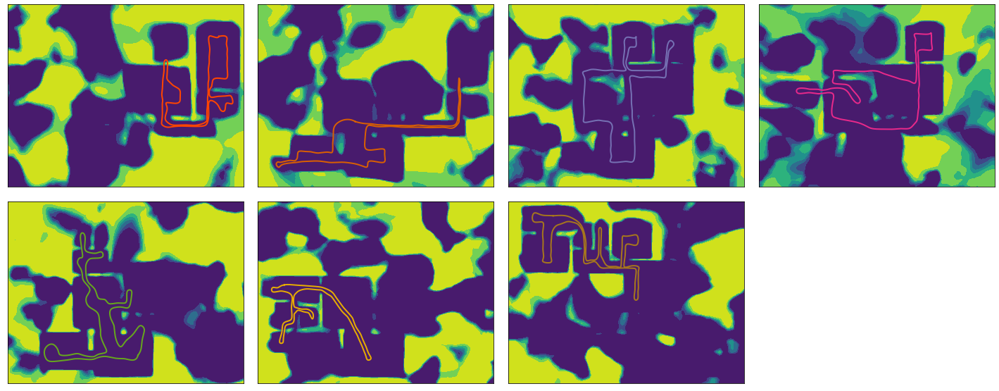

In [28]:
dens1 = results1["mesh_grid_density"]
dens2 = results2["mesh_grid_density"]
locs = results1["mesh_inputs"]

N = 7
(fig, axs) = plt.subplots(nrows=2, ncols=4, figsize=(20, 8), tight_layout=True)
axs[1, 3].remove()
colors = list(cm.get_cmap("Dark2").colors)
colors[0] = "orangered"

i = 0
for ax in axs.flatten():
    if i == 7:
        break
    # Waypoint Settings
    wp_names = glob.glob1(os.path.join(data_dir, waypoint_subdir), "*.npy") 
    
    wp_path = os.path.join(data_dir, waypoint_subdir, wp_names[i])
    wps = np.load(wp_path)
    dataset = OnlineTrajectoryLidarDataset(lidar, wps, 
        spline_res, num_scans_in_window)

    pred2 = (torch.squeeze(results_solo[i]["mesh_grid_density"]))
    ax.tricontourf(locs[:, 0], locs[:, 1], pred2)
    ax.plot(dataset.scan_locs[:, 0], dataset.scan_locs[:, 1], linewidth=2, color=colors[i])
    ax.set_xticklabels([])
    ax.set_xticks([])
    ax.set_yticklabels([])
    ax.set_yticks([])
    i += 1

fig.savefig("odense_mesh_inds.svg")

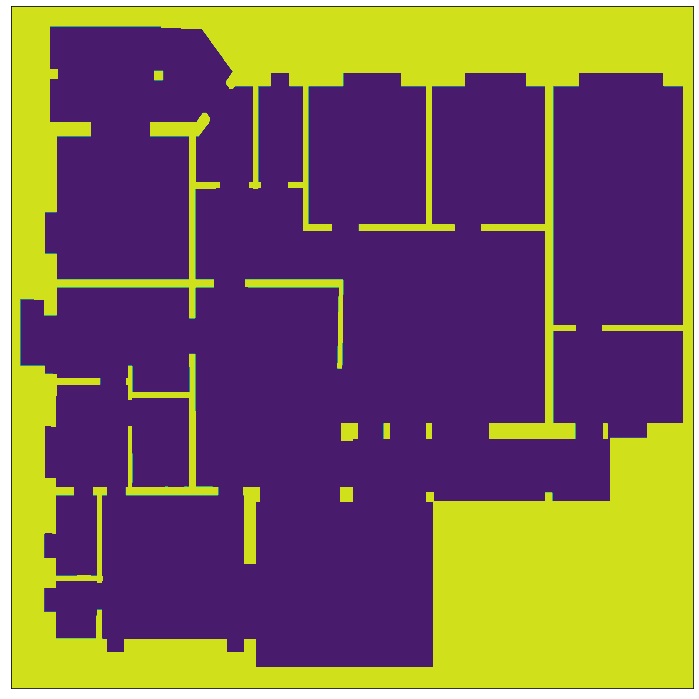

In [30]:
fig, ax = plt.subplots(tight_layout=True, figsize=(10, 10))
X, Y = np.meshgrid(lidar.xs, lidar.ys)
ax.contourf(X, Y, lidar.img)
ax.set_xticklabels([])
ax.set_xticks([])
ax.set_yticklabels([])
ax.set_yticks([])

fig.savefig("odense_ground_truth.svg")

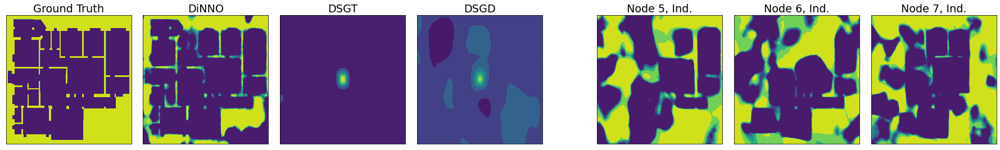

In [ ]:
dens1 = results1["mesh_grid_density"]
dens2 = results2["mesh_grid_density"]
dens3 = results3["mesh_grid_density"]
locs = results1["mesh_inputs"]

(fig, axs) = plt.subplots(nrows=1, ncols=8, figsize=(25, 4), tight_layout=True, 
    gridspec_kw=dict(width_ratios=[4,4,4,4,1,4,4,4], hspace=0))
X, Y = np.meshgrid(lidar.xs, lidar.ys)
axs[0].contourf(X, Y, lidar.img)
axs[0].set_title("Ground Truth")
axs[0].set_xticklabels([])
axs[0].set_xticks([])
axs[0].set_yticklabels([])
axs[0].set_yticks([])

axs[1].tricontourf(locs[:, 0], locs[:, 1], (torch.squeeze(dens1[-1]))[0, :])
axs[1].set_title("DiNNO")
axs[1].set_xticklabels([])
axs[1].set_xticks([])
axs[1].set_yticklabels([])
axs[1].set_yticks([])

axs[2].tricontourf(locs[:, 0], locs[:, 1], (torch.squeeze(dens2[-1]))[0, :])
axs[2].set_title("DSGT")
axs[2].set_xticklabels([])
axs[2].set_xticks([])
axs[2].set_yticklabels([])
axs[2].set_yticks([])

axs[3].tricontourf(locs[:, 0], locs[:, 1], (torch.squeeze(dens3[-1]))[0, :])
axs[3].set_title("DSGD")
axs[3].set_xticklabels([])
axs[3].set_xticks([])
axs[3].set_yticklabels([])
axs[3].set_yticks([])

axs[4].remove()

for i in range(5, 8):    
    pred2 = (torch.squeeze(results_solo[i-5]["mesh_grid_density"]))
    axs[i].tricontourf(locs[:, 0], locs[:, 1], pred2)
    axs[i].set_xticklabels([])
    axs[i].set_xticks([])
    axs[i].set_yticklabels([])
    axs[i].set_yticks([])
    axs[i].set_title("Node {}, Ind.".format(i))

fig.savefig("odense_allalg_mesh.png", dpi=800)

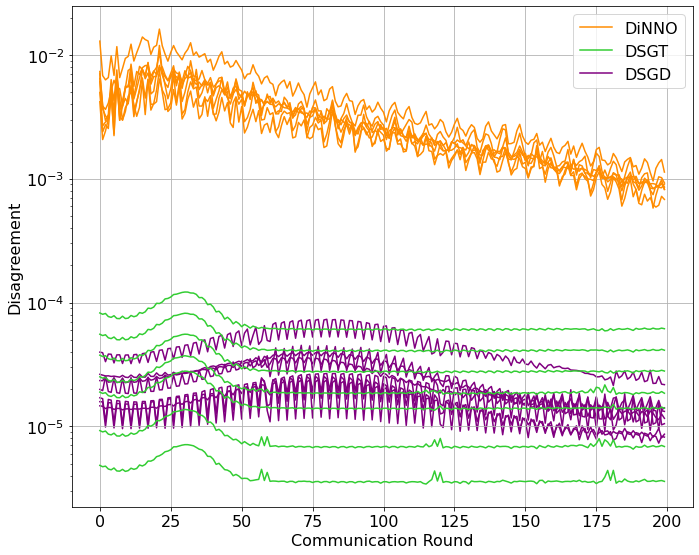

In [ ]:
ag_cadmm = torch.vstack([v[1].reshape(1, -1) for v in results1["consensus_error"]])
ag_dsgt = torch.vstack([v[1].reshape(1, -1) for v in results2["consensus_error"]])
ag_dsgd = torch.vstack([v[1].reshape(1, -1) for v in results3["consensus_error"]])

(fig, ax) = plt.subplots(figsize=(10, 8), tight_layout=True)
ax.plot(ag_cadmm[1:, :6], c=cadmm_color, zorder=3)
ax.plot(ag_cadmm[1:, 6], c=cadmm_color, label="DiNNO", zorder=3)

ax.plot(ag_dsgt[1:, :6], c=dsgt_color, zorder=2)
ax.plot(ag_dsgt[1:, 6], c=dsgt_color, label="DSGT", zorder=2)

ax.plot(ag_dsgd[1:, :6], c=dsgd_color, zorder=1)
ax.plot(ag_dsgd[1:, 6], c=dsgd_color, label="DSGD", zorder=1)

ax.set_yscale("log")
ax.grid()
ax.set_xlabel("Communication Round")
ax.set_ylabel("Disagreement")
ax.legend(loc=1)
fig.savefig("odense_agree.svg")